In [2]:
# Modified from https://github.com/facebookresearch/pytorch3d/blob/main/docs/tutorials/camera_position_optimization_with_differentiable_rendering.ipynb

# Glb file rendering and unproject

In this tutorial we will learn how to render a glb file and unproject a point from the image to the world coordinate system. 

This tutorial shows how to:
- load a mesh from an `glb` file
- initialize a `Camera`, `Shader` and `Renderer`,
- render a mesh to rgb and depth
- compute a point's screen position
- unproject rendered rgb and depth to the world coordinate system


##  Install and import modules

Ensure `torch` and `torchvision` are installed. If `pytorch3d` is not installed, install it using the following cell:

In [3]:
import os
import sys
import torch
import subprocess
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
    version_str="".join([
        f"py3{sys.version_info.minor}_cu",
        torch.version.cuda.replace(".",""),
        f"_pyt{pyt_version_str}"
    ])
    !pip install fvcore iopath
    if sys.platform.startswith("linux"):
        print("Trying to install wheel for PyTorch3D")
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
        pip_list = !pip freeze
        need_pytorch3d = not any(i.startswith("pytorch3d==") for  i in pip_list)
    if need_pytorch3d:
        print(f"failed to find/install wheel for {version_str}")
if need_pytorch3d:
    print("Installing PyTorch3D from source")
    !pip install ninja
    !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

In [4]:
import os
import cv2
import torch
import numpy as np
from tqdm.notebook import tqdm
import imageio
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from skimage import img_as_ubyte

# io utils
from pytorch3d.io import load_obj

# datastructures
from pytorch3d.structures import Meshes

# 3D transformations functions
from pytorch3d.transforms import Rotate, Translate

# rendering components
from pytorch3d.renderer import (
    FoVPerspectiveCameras, look_at_view_transform, look_at_rotation, 
    RasterizationSettings, MeshRenderer, MeshRasterizer, BlendParams,
    SoftSilhouetteShader, HardPhongShader, PointLights, TexturesVertex,
    MeshRendererWithFragments, PerspectiveCameras, SoftPhongShader
)
from pytorch3d.vis.plotly_vis import plot_scene

## Load the glb file

We will load an glb file and create a **Meshes** object. **Meshes** is a unique datastructure provided in PyTorch3D for working with **batches of meshes of different sizes**. It has several useful class methods which are used in the rendering pipeline. 

If you are running this notebook locally after cloning the PyTorch3D repository, the mesh will already be available. **If using Google Colab, fetch the mesh and save it at the path `data/`**:

In [5]:
from pytorch3d.io import IO
from pytorch3d.io.experimental_gltf_io import MeshGlbFormat

if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")

io = IO()
io.register_meshes_format(MeshGlbFormat())
mesh = io.load_mesh('./data/0_bus.glb', include_textures=True)
mesh = mesh.to(device)


## Rendering setup

### Create a renderer

A **renderer** in PyTorch3D is composed of a **rasterizer** and a **shader** which each have a number of subcomponents such as a **camera** (orthographic/perspective). Here we initialize some of these components and use default values for the rest. 


In [6]:
# Initialize a perspective camera.
# For perspective camera, the focal length and principal point should be set.
cameras = PerspectiveCameras(
    focal_length=((256.0, 256.0),),  # focal length
    principal_point=((256, 256),),  # principal point
    in_ndc=False, image_size=[[512,512]], device=device)

# To blend the 100 faces we set a few parameters which control the opacity and the sharpness of 
# edges. Refer to blending.py for more details. 
blend_params = BlendParams(sigma=1e-4, gamma=1e-4)


    
# We will also create a Phong renderer. This is simpler and only needs to render one face per pixel.
raster_settings = RasterizationSettings(
    image_size=512, 
    blur_radius=0.0, 
    faces_per_pixel=1, 
)
# We can add a point light in front of the object. 
# the setting of the ambient_color, diffuse_color, specular_color is important for the rendering result
lights = PointLights(device=device, location=((0.0000e+00, 2.9802e-08,  -1.0000e+00),),
        ambient_color=((1.0, 1.0, 1.0),),
        diffuse_color=((0.0, 0.0, 0.0),),
        specular_color=((0.0, 0.0, 0.0),),)
phong_renderer = MeshRendererWithFragments(
    rasterizer=MeshRasterizer(
        cameras=cameras, 
        raster_settings=raster_settings
    ),
    shader=HardPhongShader(device=device, cameras=cameras, 
                           lights=lights
                           )
)

### Create the rendered image


True

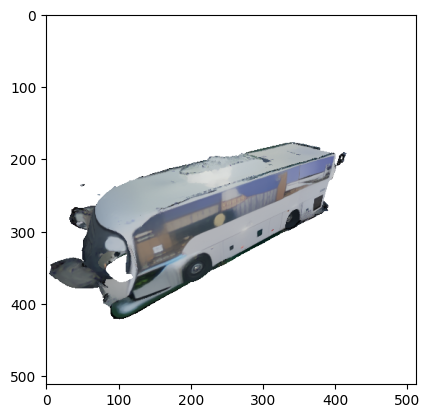

In [7]:
# Select the viewpoint using spherical angles  
distance = 0.7   # distance from camera to the object
elevation = 150.0   # angle of elevation in degrees
azimuth = 55.0  # No rotation so the camera is positioned on the +Z axis. 

# Get the position of the camera based on the spherical angles
R, T = look_at_view_transform(distance, elevation, azimuth, device=device)
 
# Render the mesh providing the values of R and T. 
image_ref, fragment = phong_renderer(meshes_world=mesh, R=R, T=T)

image_ref = image_ref.cpu().numpy()


plt.imshow(image_ref.squeeze())
plt.grid(False)
cv2.imwrite('./data/bus_image_ref.png', image_ref.squeeze()[..., [2,1,0,3]]*255)

## Compute the point's screen position

In [6]:
# pos = [-0.118891, 0.0199277, -0.138375]
pos_world = mesh.verts_packed()[4505]  # 4505
transform = cameras.get_world_to_view_transform(R=R, T=T)


# Different ways to transform the point from world to view
print(transform.get_matrix())
print(R)
print(T)
view_pos = transform.transform_points(pos_world.unsqueeze(0))
print(view_pos)
view_pos2 = torch.matmul(transform.get_matrix().transpose(1, 2), torch.cat([pos_world.unsqueeze(0), torch.ones(1,1).to(pos_world.device)], dim=1).T) # here use inverse is wrong
print(view_pos2)
view_pos3 = torch.matmul(R.squeeze().T, pos_world.unsqueeze(0).T) + T.T
print(view_pos3)

tensor([[[ 5.7358e-01,  4.0958e-01,  7.0941e-01,  0.0000e+00],
         [ 0.0000e+00,  8.6603e-01, -5.0000e-01,  0.0000e+00],
         [-8.1915e-01,  2.8679e-01,  4.9673e-01,  0.0000e+00],
         [ 0.0000e+00,  2.9802e-08,  7.0000e-01,  1.0000e+00]]],
       device='cuda:0')
tensor([[[ 0.5736,  0.4096,  0.7094],
         [ 0.0000,  0.8660, -0.5000],
         [-0.8192,  0.2868,  0.4967]]], device='cuda:0')
tensor([[-0.0000e+00, 2.9802e-08, 7.0000e-01]], device='cuda:0')
tensor([[ 0.0452, -0.0711,  0.5370]], device='cuda:0')
tensor([[[ 0.0452],
         [-0.0711],
         [ 0.5370],
         [ 1.0000]]], device='cuda:0')
tensor([[ 0.0452],
        [-0.0711],
        [ 0.5370]], device='cuda:0')


In [7]:
print(view_pos3)
print(cameras.get_projection_transform().get_matrix())
# Different ways to project the point from camera view to the screen
screen_pos_homo = torch.matmul(cameras.get_projection_transform().get_matrix().squeeze(0).T, torch.cat([view_pos3, torch.ones(1,1).to(view_pos3.device)], dim=0))
screen_pos = screen_pos_homo[:2]/screen_pos_homo[3]
print(screen_pos_homo)
print(screen_pos)

tensor([[ 0.0452],
        [-0.0711],
        [ 0.5370]], device='cuda:0')
tensor([[[256.,   0.,   0.,   0.],
         [  0., 256.,   0.,   0.],
         [256., 256.,   0.,   1.],
         [  0.,   0.,   1.,   0.]]], device='cuda:0')
tensor([[149.0217],
        [119.2545],
        [  1.0000],
        [  0.5370]], device='cuda:0')
tensor([[277.5290],
        [222.0924]], device='cuda:0')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


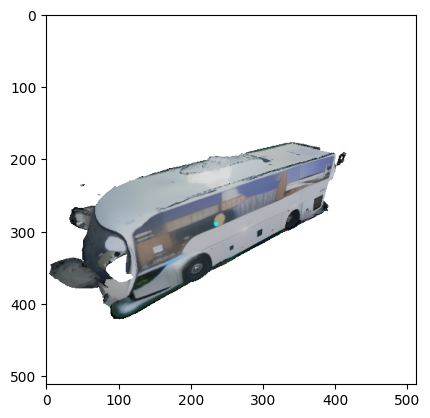

In [8]:
image_ref_with_point = image_ref.copy().squeeze()
# use opencv to draw a point on the image,
# 512-int(screen_pos[0]) 512-int(screen_pos[1])
#TODO: I don't quite understand why is this conversion needed
image_ref_with_point = cv2.circle(image_ref_with_point, (512- int(screen_pos[0]), 512 - int(screen_pos[1])), 3, (0, 255, 255, 1), -1) 
plt.imshow(image_ref_with_point)
plt.grid(False)
# cv2.imwrite('./data/bus_image_ref_with_point.png', image_ref_with_point.squeeze()*255)

In [9]:
fig = plot_scene({
    "Subplot 1": {
        "Mesh Trace": mesh,
        # "Point Cloud Trace": point_cloud
        "Cameras Trace": cameras,
    }
})
fig.show()

In [10]:
fragment.zbuf.shape

torch.Size([1, 512, 512, 1])

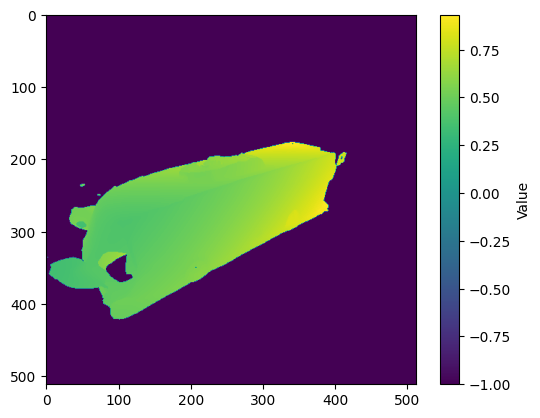

In [11]:
zbuf_array = fragment.zbuf.cpu().numpy().squeeze()


# plt.imshow(zbuf_array)
# plt.grid(False)
plt.imshow(zbuf_array, cmap='viridis')  # could specify the color map, such as 'viridis', 'plasma', 'inferno' 等
plt.colorbar(label='Value')  # add color bar, and set label
plt.grid(False)  # close grid
plt.show()
# cv2.imwrite('./data/bus_image_ref.png', image_ref.squeeze()*255)

## Unproject the rgb and depth map from the screen to the world coordinate system


In [12]:

def depth_to_point_cloud(depth_map, K, invalid_value=-1):
    """
    convert depth map to point cloud, and filter invalid values.

    Args:
        depth_map (torch.Tensor): depth map, shape (H, W).
        K (torch.Tensor): camera intrinsic matrix, shape (3, 3).
        invalid_value (float): the value in depth map that represents invalid points (default is -1).

    Returns:
        points_3d (torch.Tensor): valid point cloud coordinates, shape (N, 3), where N is the number of valid points.
    """
    # get the height and width of the depth map
    H, W = depth_map.shape

    # generate the pixel coordinate grid
    u = torch.arange(W, device=depth_map.device)  # u coordinate [0, W-1]
    v = torch.arange(H, device=depth_map.device)  # v coordinate [0, H-1]
    u, v = torch.meshgrid(u, v, indexing='xy')    # generate the grid, shape (H, W)

    # flatten the pixel coordinate
    u = u.reshape(-1)  # shape (H*W,)
    v = v.reshape(-1)  # shape (H*W,)
    z = depth_map.reshape(-1)  # flatten the depth value, shape (H*W,)

    #TODO: not sure why need to convert the coordinate
    u = 512 - u
    v = 512 - v
    # filter invalid values
    valid_mask = z != invalid_value  # valid points mask
    u = u[valid_mask]  # only keep valid u coordinates
    v = v[valid_mask]  # only keep valid v coordinates
    z = z[valid_mask]  # only keep valid depth values

    # extract parameters from camera intrinsic matrix
    fx = K[0, 0]
    fy = K[1, 1]
    cx = K[0, 2]
    cy = K[1, 2]

    # compute 3D point coordinates
    x = (u - cx) * z / fx
    y = (v - cy) * z / fy

    # combine to point cloud
    points_3d = torch.stack((x, y, z), dim=-1)  # shape (N, 3), where N is the number of valid points

    return points_3d

In [13]:
def rgbd_to_point_cloud(rgb_image, depth_map, K, invalid_value=-1):
    """
    convert RGB image and depth map to point cloud with color, and filter invalid values.

    Args:
        rgb_image (torch.Tensor): RGB image, shape (3, H, W), value range [0, 1].
        depth_map (torch.Tensor): depth map, shape (H, W).
        K (torch.Tensor): camera intrinsic matrix, shape (3, 3).
        invalid_value (float): the value in depth map that represents invalid points (default is -1).

    Returns:
        points_3d (torch.Tensor): valid point cloud coordinates, shape (N, 3), where N is the number of valid points.
        colors (torch.Tensor): valid point cloud colors, shape (N, 3).
    """
    # convert depth map to point cloud
    points_3d = depth_to_point_cloud(depth_map, K, invalid_value)  # shape (N, 3)

    # convert RGB image to color information
    colors = rgb_image.permute(1, 2, 0).reshape(-1, 3)  # shape (H*W, 3)

    # filter invalid values corresponding colors
    valid_mask = depth_map.reshape(-1) != invalid_value  # valid points mask
    colors = colors[valid_mask]  # only keep valid colors

    return points_3d, colors

In [14]:
from pytorch3d.structures import Pointclouds
K = [[256.0, 0, 256.0], [0, 256.0, 256.0], [0, 0, 1]]
# generate point cloud and color
points_3d, colors = rgbd_to_point_cloud(torch.from_numpy(image_ref.squeeze()[:,:,:3]), torch.from_numpy(zbuf_array), torch.from_numpy(np.array(K)), invalid_value=-1)

# create point cloud structure
point_cloud = Pointclouds(points=[points_3d], features=[colors])

In [15]:
from pytorch3d.vis.plotly_vis import plot_scene

# visualize point cloud
plot_scene({
    "Colored Point Cloud": {
        "point_cloud": point_cloud
    }
})

In [16]:
from pytorch3d.io import save_ply
from pytorch3d.structures import Pointclouds

# save as PLY file
# get point cloud coordinates and colors
points = point_cloud.points_list()[0]  # shape (N, 3)
colors = point_cloud.features_list()[0]  # shape (N, 3)

# save as PLY file
save_ply("./data/bus_unproject_camera_point_cloud.ply", points, colors)

In [17]:
def camera_to_world(points_camera, R, T):
    """
    convert point cloud from camera coordinate system to world coordinate system.

    Args:
        points_camera (torch.Tensor): point cloud coordinates in camera coordinate system, shape (N, 3).
        R (torch.Tensor): camera rotation matrix, shape (3, 3).
        T (torch.Tensor): camera translation vector, shape (3,).

    Returns:
        points_world (torch.Tensor): point cloud coordinates in world coordinate system, shape (N, 3).
    """
    # convert T to column vector
    T = T.reshape(3, 1)  # shape (3, 1)

    # convert point cloud from camera coordinate system to world coordinate system
    points_world = torch.matmul(R, (points_camera.T - T)).T
    return points_world

In [18]:
# assume points_camera is the point cloud coordinates in camera coordinate system, shape (N, 3)
points_camera = torch.tensor(points).to(device).to(torch.float32)  


# convert point cloud from camera coordinate system to world coordinate system
points_world = camera_to_world(points_camera, R.squeeze(), T.squeeze())

/p/weakocc/.cache/ipykernel_931935/2635895203.py:2: UserWarning:

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).



In [19]:
points_world.shape
save_ply("./data/bus_unproject_world_point_cloud.ply", points_world, colors)